#### Example notebook to demonstrate usage of functions in biosynseq.metrics and biosynseq.visualize for the following purposes:
- Visualize embeddings for generated, test, or validation sequences using t-SNE and UMAP.
- Plot the embedding L2 distance against the pairwise global/local alignment scores for the embeddings.
- Plot the histogram distributions for each sequence metric.
- Plot the histogram distributions of mean, max, and min alignment scores between the alignment of two collections of sequences. <br>

These visualizations allow the user to evaluate the performance of a deep learning model in terms of learning important sequence properties and generating novel nucleotide sequences with relevant properties. 

In [1]:
from biosynseq import metrics
from biosynseq import visualize
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

In [2]:
%config InlineBackend.figure_format='retina'
%matplotlib inline
plt.rcParams['figure.figsize'] = [8,6]
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams.update({'font.size':14})

# 1. Get t-SNE plots

### generated sequences

In [3]:
gen_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/gpt2_generated_embeddings.npy")
gen_fasta_path = Path("/homes/mzvyagin/MDH/perlmutter_data/globalstep2850.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/tsne_gen.png")

Your plot has been saved to /homes/lind/MDH-pipeline/visualize/tsne_gen.png


{'GC':            z0         z1         GC
 0    2.702663  14.580293  36.893204
 1   -0.327129 -11.376406  58.878505
 2    4.556612   0.748791  52.197213
 3   -3.163981  -6.803540  61.788618
 4   -1.095338  -3.054771  55.691057
 ..        ...        ...        ...
 123 -2.424648  -6.877491  61.788618
 124 -0.405869  -2.984710  55.691057
 125  0.883591  15.195834  36.655949
 126  1.674165   0.693322  46.917450
 127 -3.792577 -11.143340  65.835929
 
 [128 rows x 3 columns],
 'SequenceLength':            z0         z1  SequenceLength
 0    2.702663  14.580293             927
 1   -0.327129 -11.376406             963
 2    4.556612   0.748791             933
 3   -3.163981  -6.803540             984
 4   -1.095338  -3.054771             984
 ..        ...        ...             ...
 123 -2.424648  -6.877491             984
 124 -0.405869  -2.984710             984
 125  0.883591  15.195834             933
 126  1.674165   0.693322             957
 127 -3.792577 -11.143340             963
 

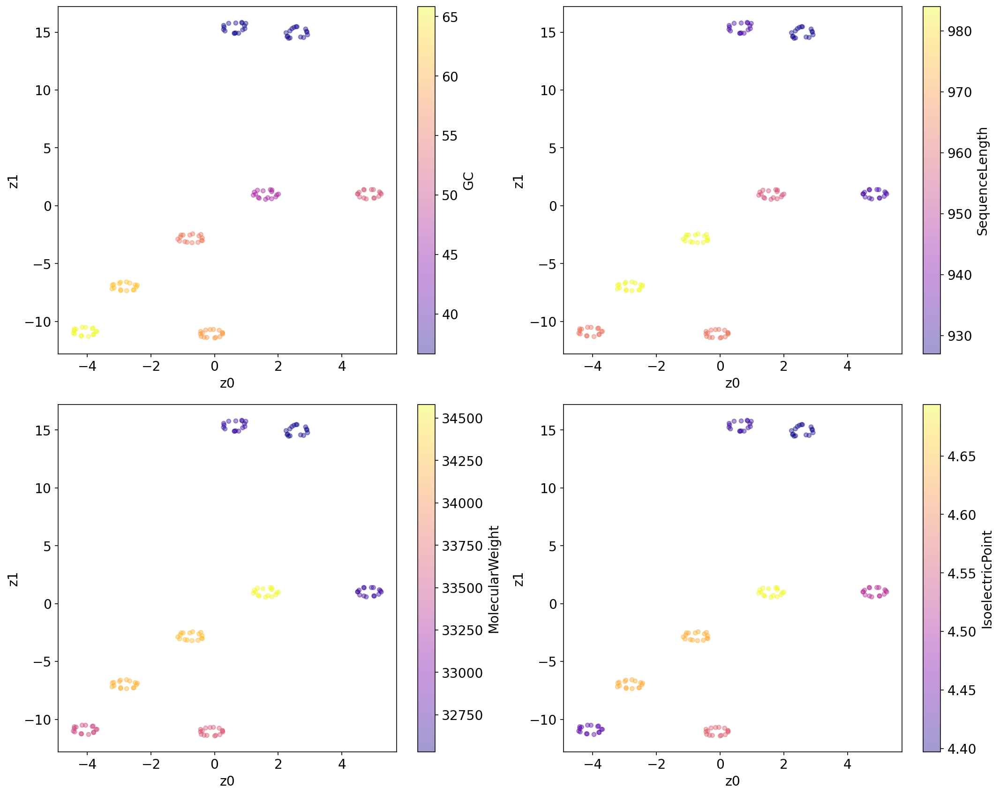

In [4]:
embed_avg = metrics.get_embed_avg(embed_path=gen_embed_path)
gen_paint_df = visualize.get_paint_df(fasta_path=gen_fasta_path, embed_path=gen_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, 
                      paint_df=gen_paint_df, 
                      save_path = save_path, 
                      tsne_umap="tsne", 
                      get_subplots=True)

### Test sequences

In [6]:
#test_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/inference-test-embeddings.npy")
test_embed_path = Path("/homes/abrace/data/mdh/gptneox_25M/embeddings/gptneox-25M-MDH-test.npy")
test_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/test.fasta")
save_path = None #Path("/homes/lind/MDH-pipeline/visualize/tsne_test.png")

In [10]:
embed_avg.shape

(3663, 512)

{'GC':               z0          z1         GC
 0      70.156136 -104.904350  44.337607
 1      43.276787   41.393929  57.157157
 2     -55.792965  240.411957  60.717658
 3      -7.922755   75.667389  44.764957
 4    -183.902344   85.484383  61.212121
 ...          ...         ...        ...
 3658   63.140602 -149.611862  64.831804
 3659  221.812073   76.908615  31.775701
 3660  -17.797739  -24.276913  67.581301
 3661  -70.606033 -143.038361  55.763240
 3662  131.148315   91.851692  42.323232
 
 [3663 rows x 3 columns],
 'SequenceLength':               z0          z1  SequenceLength
 0      70.156136 -104.904350             936
 1      43.276787   41.393929             999
 2     -55.792965  240.411957            1059
 3      -7.922755   75.667389             936
 4    -183.902344   85.484383             990
 ...          ...         ...             ...
 3658   63.140602 -149.611862             981
 3659  221.812073   76.908615             963
 3660  -17.797739  -24.276913             

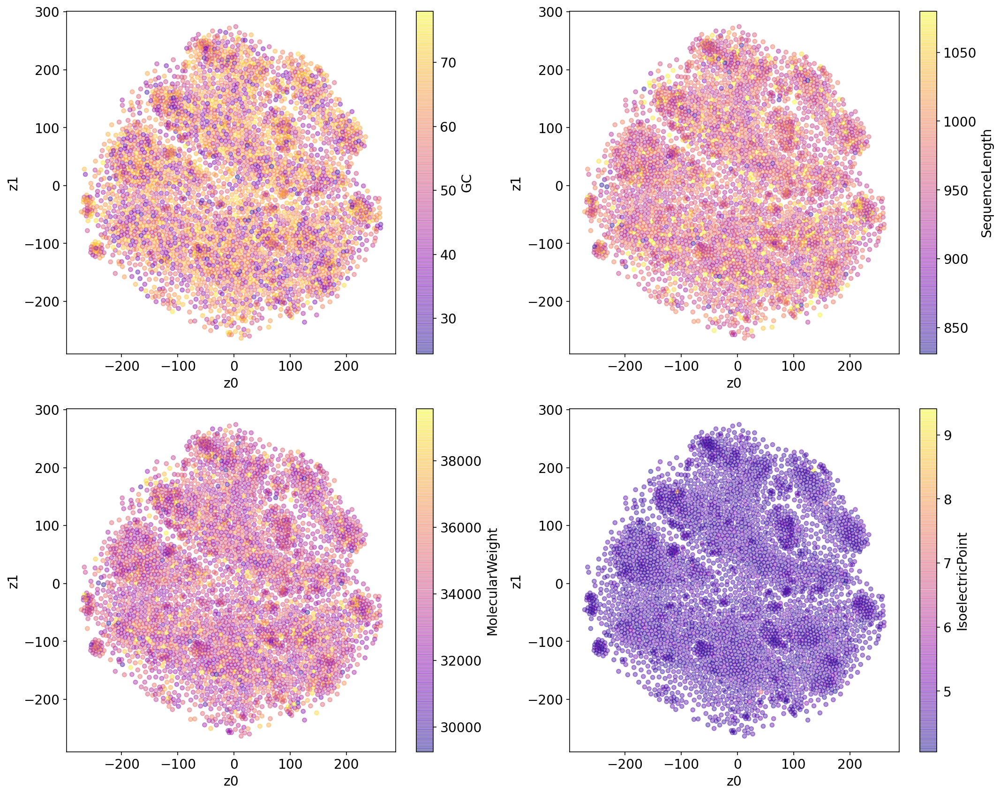

In [9]:
#embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)
embed_avg = np.load(test_embed_path)
test_paint_df = visualize.get_paint_df(fasta_path=test_fasta_path, embed_path=test_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, 
                      paint_df=test_paint_df, 
                      save_path = save_path, 
                      tsne_umap="tsne", 
                      get_subplots=True)

### Validation sequences

In [7]:
val_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/inference-val-embeddings.npy")
val_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/val.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/tsne_val.png")

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


Your plot has been saved to /homes/lind/MDH-pipeline/visualize/tsne_val.png


{'GC':               z0          z1         GC
 0    -216.318085   10.433082  60.403397
 1     -73.865044 -216.525818  67.085954
 2     -15.377599   97.397812  44.479830
 3     -54.393703  195.324005  40.000000
 4     -69.524628 -162.823059  62.824507
 ...          ...         ...        ...
 3659   -4.915565 -135.852112  61.398176
 3660  -76.779541 -249.095062  62.193823
 3661    7.267775 -169.449738  63.525836
 3662    1.324017  -70.878021  58.662614
 3663  219.934860  -99.619026  64.204545
 
 [3664 rows x 3 columns],
 'SequenceLength':               z0          z1  SequenceLength
 0    -216.318085   10.433082             942
 1     -73.865044 -216.525818             954
 2     -15.377599   97.397812             942
 3     -54.393703  195.324005             930
 4     -69.524628 -162.823059             963
 ...          ...         ...             ...
 3659   -4.915565 -135.852112             987
 3660  -76.779541 -249.095062             939
 3661    7.267775 -169.449738             

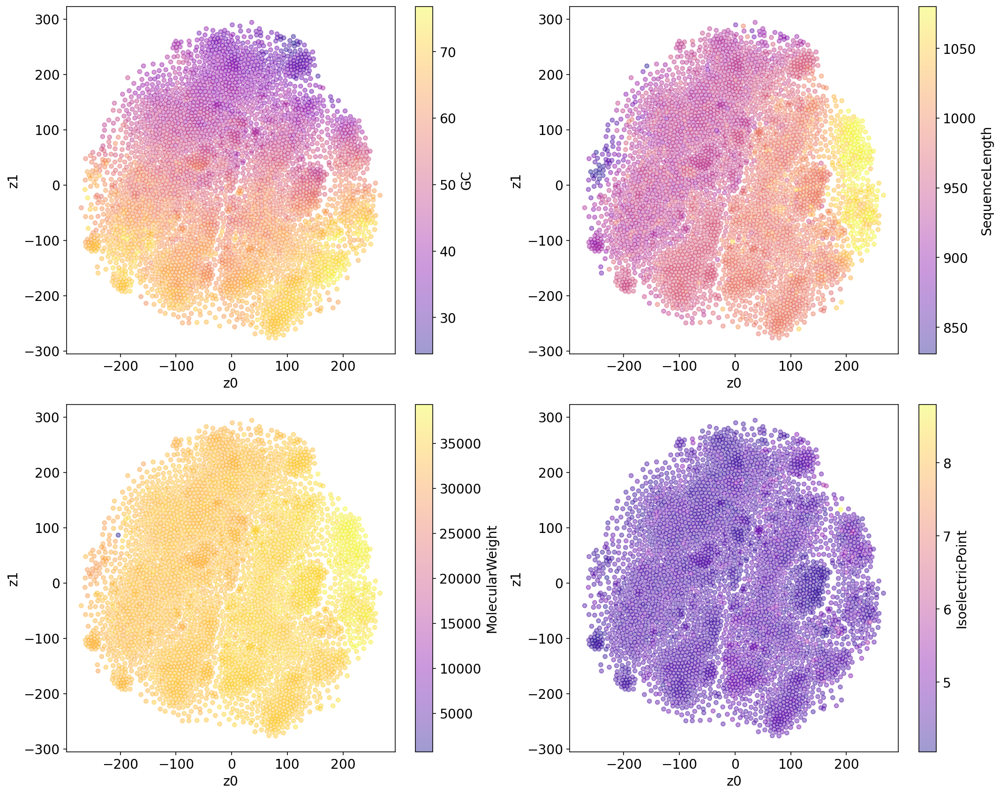

In [8]:
embed_avg = metrics.get_embed_avg(embed_path=val_embed_path)
val_paint_df = visualize.get_paint_df(fasta_path=val_fasta_path, embed_path=val_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, 
                      paint_df=val_paint_df, 
                      save_path = save_path, 
                      tsne_umap="tsne", 
                      get_subplots=True)

# 2. Get UMAP plots

### Generated Sequences

In [9]:
gen_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/gpt2_generated_embeddings.npy")
gen_fasta_path = Path("/homes/mzvyagin/MDH/perlmutter_data/globalstep2850.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/umap_gen.png")

In [10]:
umap_n_neighbors = 15 # default = 15
umap_min_dist = 0.1 # default = 0.1
umap_spread = 1.0 # default = 1.0
umap_random_state=10 # default = 10

Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_gen.png


{'GC':             z0         z1         GC
 0     7.389132  -0.594496  36.893204
 1     0.465836  -8.195488  58.878505
 2   -16.068207  -0.550386  52.197213
 3     2.961643  12.836628  61.788618
 4    19.223923   9.467081  55.691057
 ..         ...        ...        ...
 123   3.564610  12.906284  61.788618
 124  19.724739   9.756105  55.691057
 125  -8.569005  -7.415097  36.655949
 126   1.065168 -17.706856  46.917450
 127  -2.997767   4.846734  65.835929
 
 [128 rows x 3 columns],
 'SequenceLength':             z0         z1  SequenceLength
 0     7.389132  -0.594496             927
 1     0.465836  -8.195488             963
 2   -16.068207  -0.550386             933
 3     2.961643  12.836628             984
 4    19.223923   9.467081             984
 ..         ...        ...             ...
 123   3.564610  12.906284             984
 124  19.724739   9.756105             984
 125  -8.569005  -7.415097             933
 126   1.065168 -17.706856             957
 127  -2.997767   4.

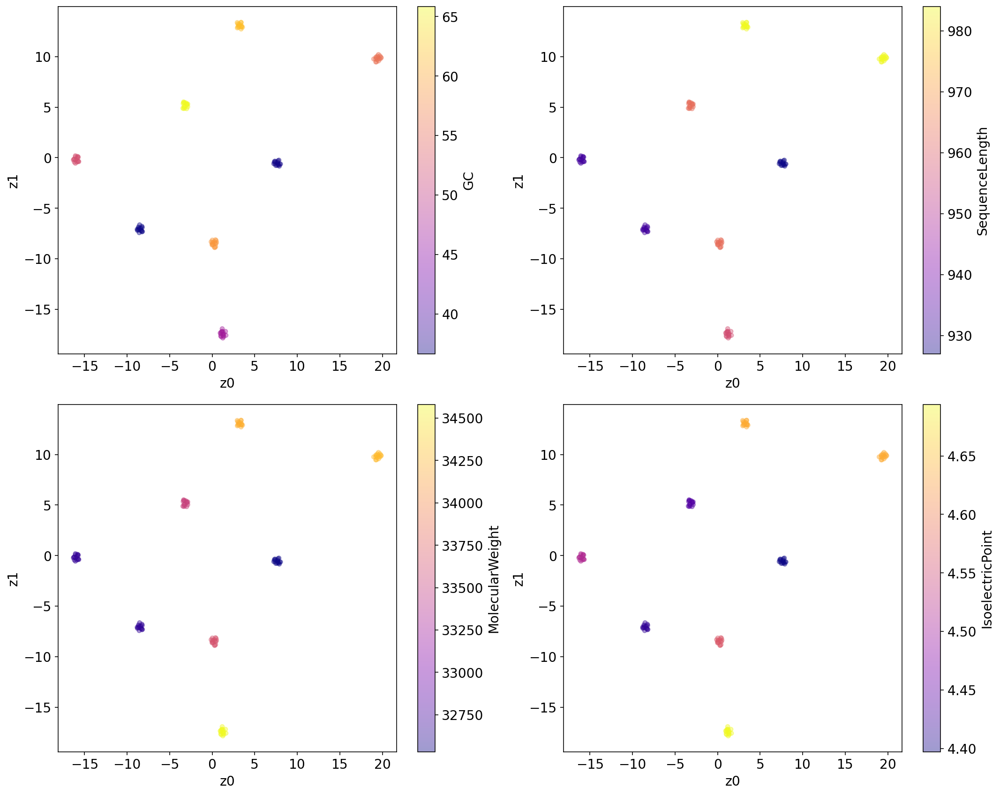

In [11]:
embed_avg = metrics.get_embed_avg(embed_path=gen_embed_path)
gen_paint_df = visualize.get_paint_df(fasta_path=gen_fasta_path, embed_path=gen_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, 
                      paint_df=gen_paint_df, 
                      save_path = save_path, 
                      tsne_umap="umap", 
                      get_subplots=True)

### Test Sequences

In [12]:
test_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/inference-test-embeddings.npy")
test_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/test.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/umap_test.png")

In [13]:
umap_n_neighbors = 15 # default = 15
umap_min_dist = 0.1 # default = 0.1
umap_spread = 1.0 # default = 1.0
umap_random_state=10 # default = 10

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_test.png


{'GC':             z0        z1         GC
 0     3.685448  5.675566  44.337607
 1     0.587249 -1.316251  57.157157
 2     0.904962 -6.200028  60.717658
 3     2.620651  3.205788  44.764957
 4    -3.681179 -3.095888  61.212121
 ...        ...       ...        ...
 3651 -4.479226 -3.784634  65.653495
 3652  0.045851 -1.712515  60.341365
 3653  2.924804 -5.269952  52.037037
 3654 -2.091721  2.751355  57.792208
 3655 -4.131907 -6.505486  69.529652
 
 [3656 rows x 3 columns],
 'SequenceLength':             z0        z1  SequenceLength
 0     3.685448  5.675566             936
 1     0.587249 -1.316251             999
 2     0.904962 -6.200028            1059
 3     2.620651  3.205788             936
 4    -3.681179 -3.095888             990
 ...        ...       ...             ...
 3651 -4.479226 -3.784634             987
 3652  0.045851 -1.712515             996
 3653  2.924804 -5.269952            1080
 3654 -2.091721  2.751355             924
 3655 -4.131907 -6.505486             978


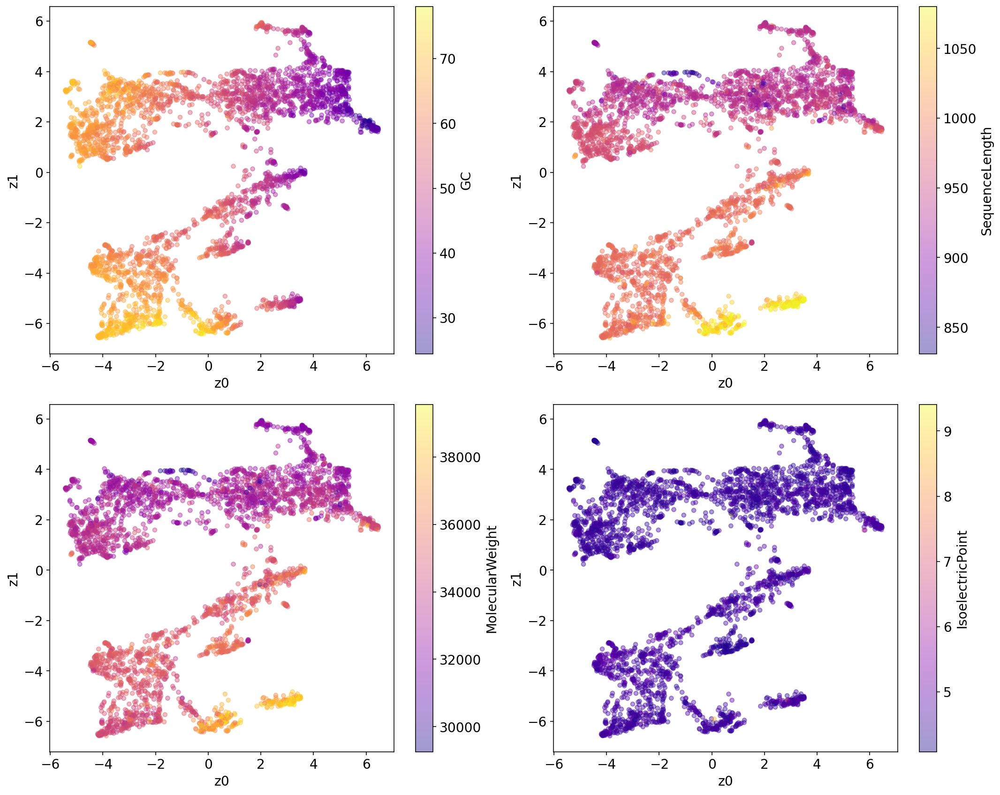

In [14]:
embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)
test_paint_df = visualize.get_paint_df(fasta_path=test_fasta_path, embed_path=test_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, 
                      paint_df=test_paint_df, 
                      save_path = save_path, 
                      tsne_umap="umap", 
                      get_subplots=True)

### Validation sequences

In [15]:
val_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/inference-val-embeddings.npy")
val_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/val.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/umap_val.png")

In [16]:
umap_n_neighbors = 15 # default = 15
umap_min_dist = 0.1 # default = 0.1
umap_spread = 1.0 # default = 1.0
umap_random_state=10 # default = 10

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_val.png


{'GC':             z0        z1         GC
 0    -1.675152 -1.292830  60.403397
 1    -3.036141  4.762235  67.085954
 2    -2.647373 -3.773308  44.479830
 3    -4.350834 -4.452694  40.000000
 4    -2.466116  4.166238  62.824507
 ...        ...       ...        ...
 3659  0.810641  4.646047  61.398176
 3660 -2.193107  3.920607  62.193823
 3661  0.850491  5.604160  63.525836
 3662  0.838490  3.862798  58.662614
 3663  4.424069  1.780692  64.204545
 
 [3664 rows x 3 columns],
 'SequenceLength':             z0        z1  SequenceLength
 0    -1.675152 -1.292830             942
 1    -3.036141  4.762235             954
 2    -2.647373 -3.773308             942
 3    -4.350834 -4.452694             930
 4    -2.466116  4.166238             963
 ...        ...       ...             ...
 3659  0.810641  4.646047             987
 3660 -2.193107  3.920607             939
 3661  0.850491  5.604160             987
 3662  0.838490  3.862798             987
 3663  4.424069  1.780692            1056


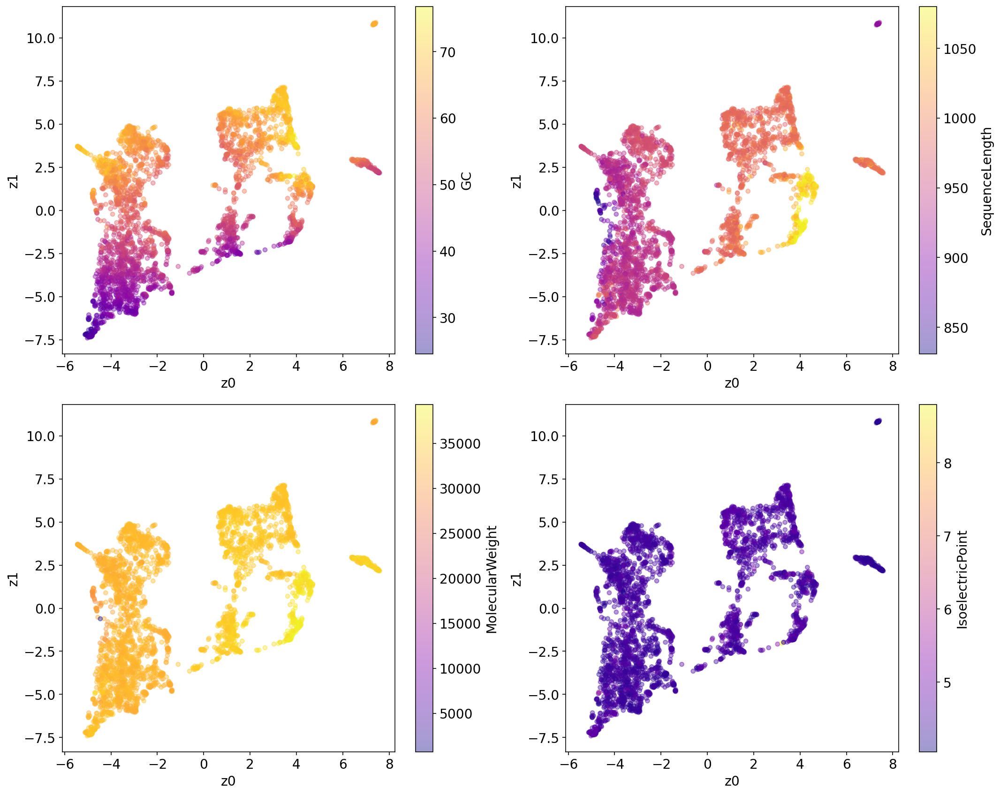

In [17]:
embed_avg = metrics.get_embed_avg(embed_path=val_embed_path)
paint_df = visualize.get_paint_df(fasta_path=val_fasta_path, embed_path=val_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, 
                      paint_df=val_paint_df, 
                      save_path = save_path, 
                      tsne_umap="umap", 
                      get_subplots=True)

# 3. Get histograms distributions for the sequence metrics

#### (1) If you want to plot the sequence metrics distributions of test, validation, generated (and training, if applicable) sequences against each other:

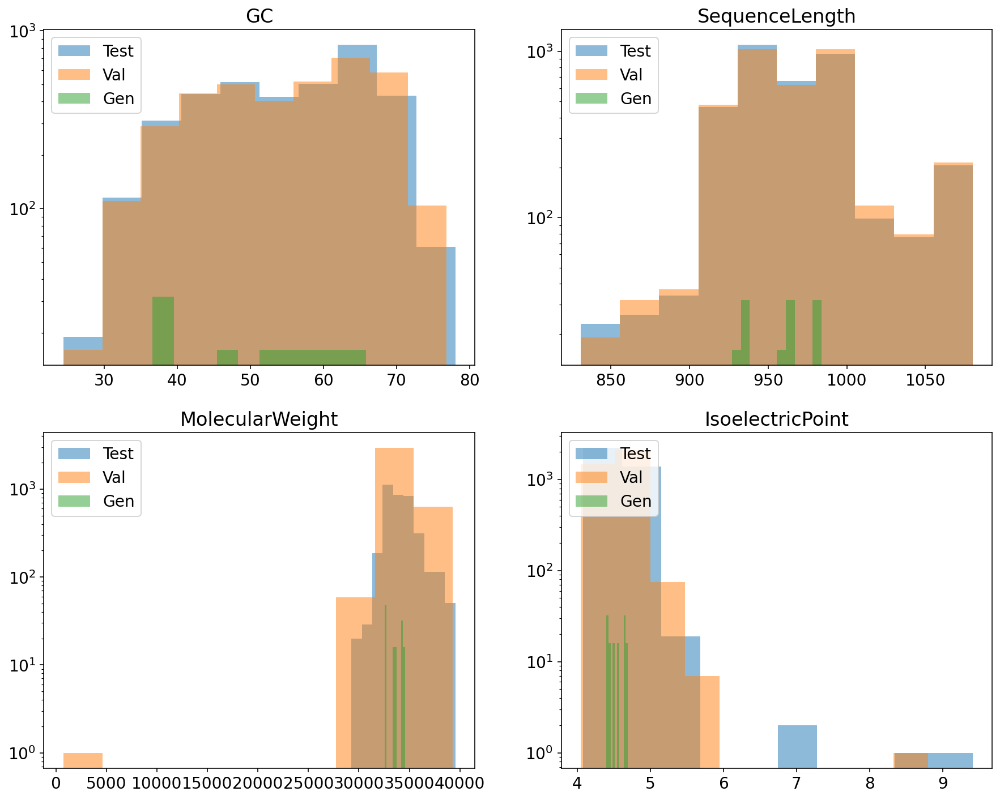

In [18]:
labels = ["Test", "Val", "Gen"]
paint_dfs = [test_paint_df, val_paint_df, gen_paint_df]
visualize.plot_metrics_hist(paint_dfs=paint_dfs, labels=labels)

#### (2) If you only want to plot the metrics distributions of one type of sequences, for example, test sequences:

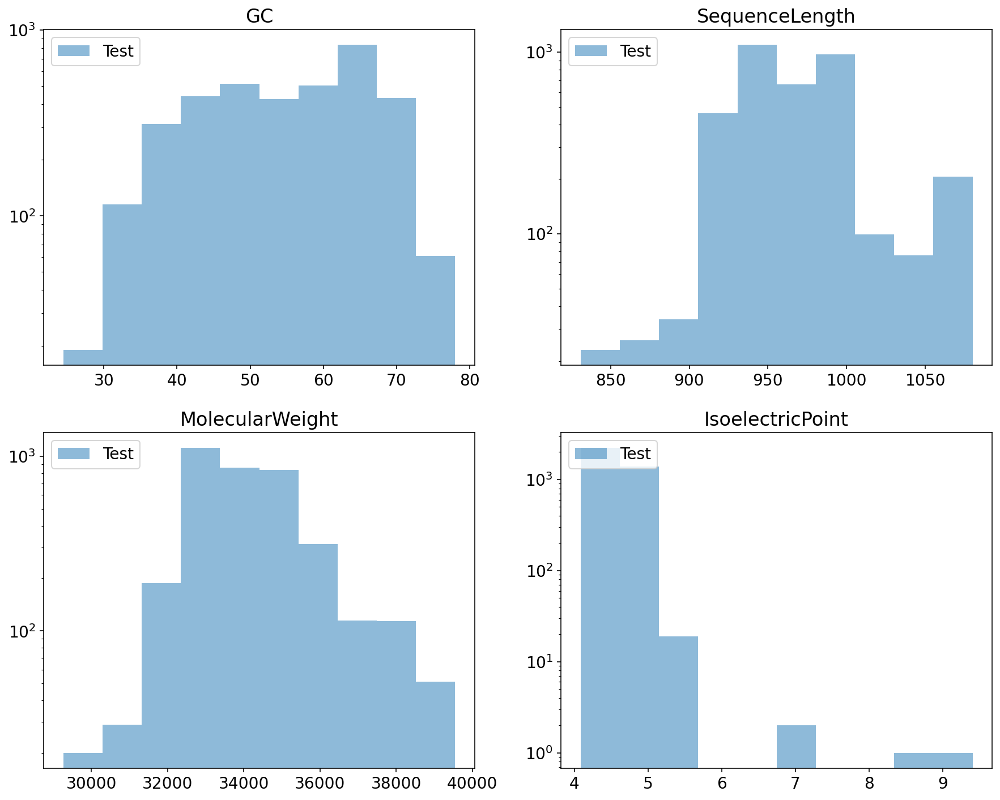

In [19]:
labels = ["Test"]
paint_dfs = [test_paint_df]
visualize.plot_metrics_hist(paint_dfs=paint_dfs, labels=labels)

# 4. Plot embedding L2 distance vs. alignment score 
Example: Global alignment. <br>
Note: Local alignment scores would currently look the same as global alignment scores, since the scoring metrics for either have not been tuned and are thus the same. 

### Test sequences

In [20]:
test_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/inference-test-embeddings.npy")
test_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/test.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/embed_dist_vs_align_score_test.png")
align_plot_title = "Test Sequences"
alignment_type = "global"
num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

In [21]:
embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)
dna_seqs = metrics.get_seqs_from_fasta(fasta_path=test_fasta_path)
embed = np.load(test_embed_path)
dna_seqs = dna_seqs[: len(embed)]  # clip DNA sequence to embedding length
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


In [22]:
# Compute the pairwise global alignment score
test_protein_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=protein_seqs,
    seqs2_rec=protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

3656it [05:48, 10.49it/s]


In [23]:
test_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg,
    scores_matrix=test_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
test_scores_df.corr()

,Embedding L2 Distance,Global Alignment Score
Embedding L2 Distance,1.000000,-0.297758
Global Alignment Score,-0.297758,1.000000


<AxesSubplot:title={'center':'Test Sequences'}, xlabel='Global Alignment Score', ylabel='Embedding L2 Distance'>

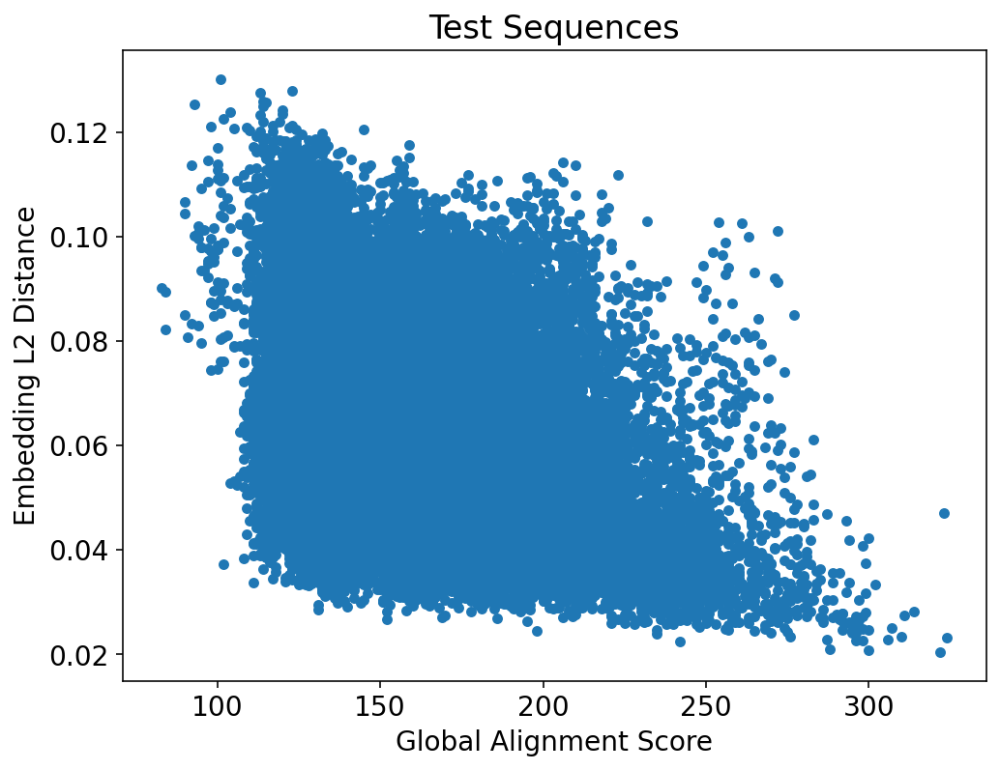

In [24]:
test_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Global Alignment Score",
                                  title=align_plot_title)

In [25]:
test_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=test_scores_df, alignment_type=alignment_type, 
)
test_avg_scores_df.corr()

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
avg_embed_dist,1.000000,0.261829,-0.967206
stdev_embed_dist,0.261829,1.000000,-0.393907
Global Alignment Score,-0.967206,-0.393907,1.000000


In [26]:
test_avg_scores_df

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
0,0.103073,0.000000,73.0
1,0.100218,0.000000,75.0
2,0.110193,0.000000,76.0
3,0.098175,0.000000,77.0
4,0.097871,0.000912,78.0
...,...,...,...
259,0.026762,0.000000,336.0
260,0.026694,0.000000,338.0
261,0.021673,0.000000,342.0
262,0.025710,0.000000,343.0


Embedding distance vs. alignment score plot has been saved to /homes/lind/MDH-pipeline/visualize/embed_dist_vs_align_score_test.png.


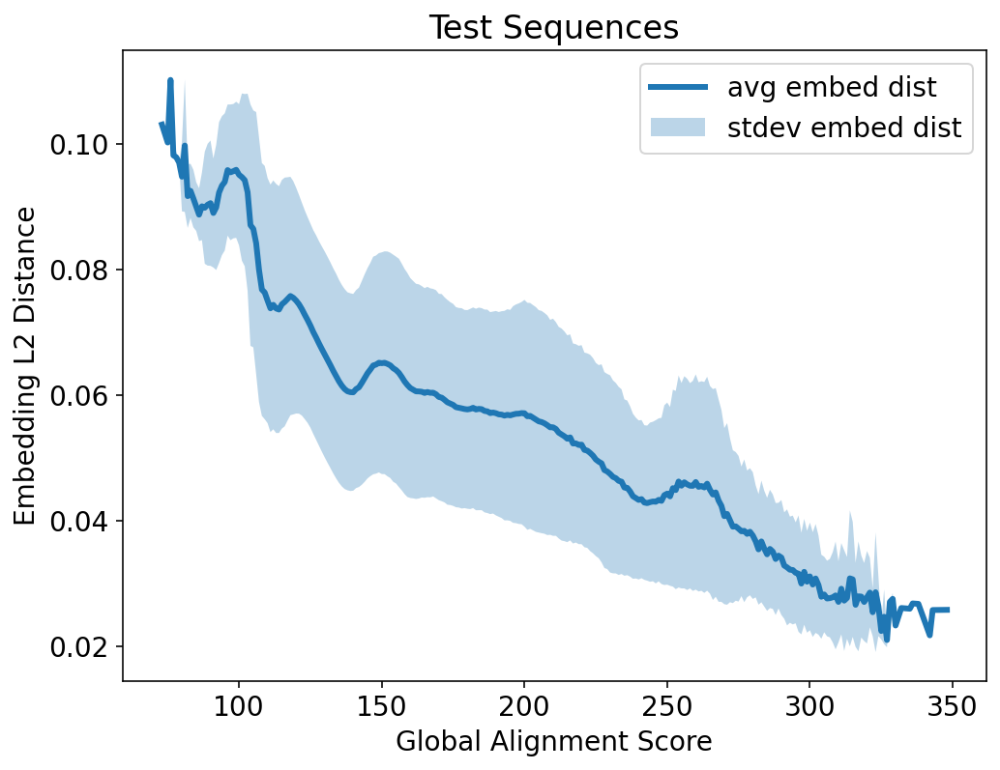

In [27]:
# plot the embedding L2 distance against the pairwise global alignment scores
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=test_avg_scores_df,
    save_path=save_path,
    alignment_type=alignment_type,
    plot_title=align_plot_title
)

In [28]:
# calculate the p-value of the Pearson correlation
from scipy.stats.stats import pearsonr

#calculation correlation coefficient and p-value between average embedding distance and global alignment score
corr_result = pearsonr(test_avg_scores_df["avg_embed_dist"], test_avg_scores_df["Global Alignment Score"])
pearson_corr = corr_result[0] # Pearson correlation
p_val = corr_result[1] # p-value
print(corr_result)
print(pearson_corr)
print(p_val)

(-0.9672055828568472, 5.899958216431588e-158)
-0.9672055828568472
5.899958216431588e-158


/tmp/ipykernel_3191048/3023642792.py:2: DeprecationWarning: Please use `pearsonr` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import pearsonr


### Validation sequences

In [29]:
val_embed_path = Path("/homes/mzvyagin/MDH/perlmutter_data/inference-val-embeddings.npy")
val_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/val.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/embed_dist_vs_align_score_val.png")
align_plot_title = "Validation Sequences"
alignment_type = "global"
num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

In [30]:
embed_avg = metrics.get_embed_avg(embed_path=val_embed_path)
dna_seqs = metrics.get_seqs_from_fasta(fasta_path=val_fasta_path)
embed = np.load(val_embed_path)
dna_seqs = dna_seqs[: len(embed)]  # clip DNA sequence to embedding length
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


In [31]:
# Compute the pairwise global alignment score
val_protein_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=protein_seqs,
    seqs2_rec=protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

3664it [04:52, 12.54it/s]


In [32]:
val_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg,
    scores_matrix=val_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
val_scores_df.corr()

,Embedding L2 Distance,Global Alignment Score
Embedding L2 Distance,1.000000,-0.299994
Global Alignment Score,-0.299994,1.000000


<AxesSubplot:title={'center':'Validation Sequences'}, xlabel='Global Alignment Score', ylabel='Embedding L2 Distance'>

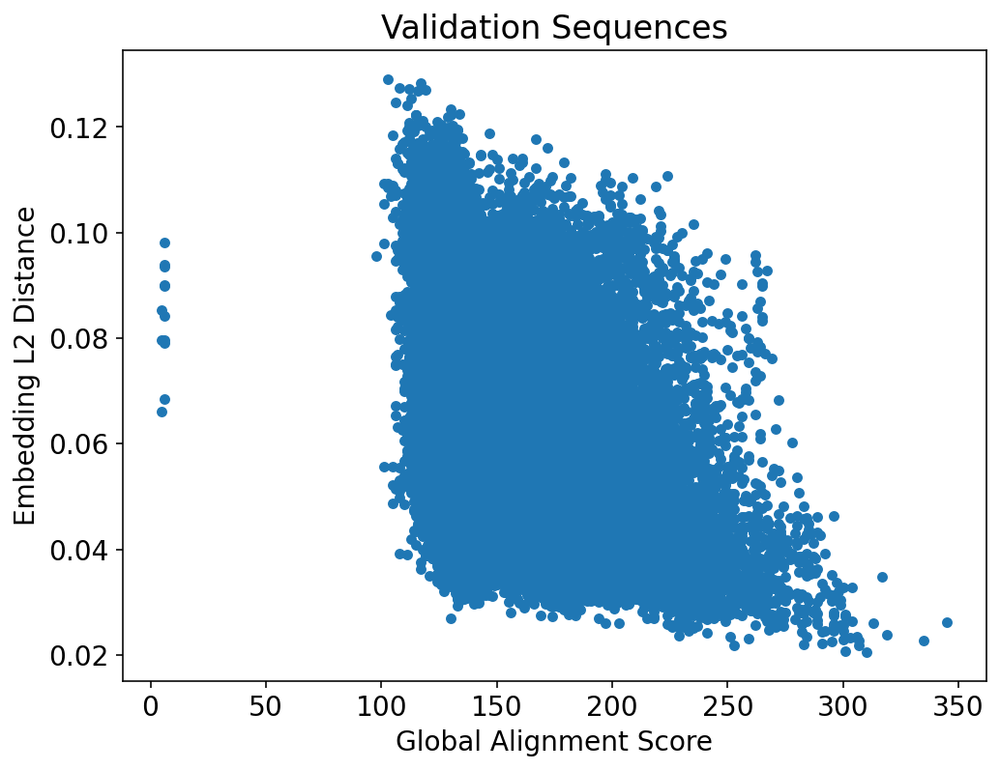

In [33]:
val_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Global Alignment Score", 
                              title=align_plot_title)

In [34]:
val_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=val_scores_df, alignment_type=alignment_type
)
val_avg_scores_df.corr()

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
avg_embed_dist,1.000000,0.635039,-0.93961
stdev_embed_dist,0.635039,1.000000,-0.67655
Global Alignment Score,-0.939610,-0.676550,1.00000


Embedding distance vs. alignment score plot has been saved to /homes/lind/MDH-pipeline/visualize/embed_dist_vs_align_score_val.png.


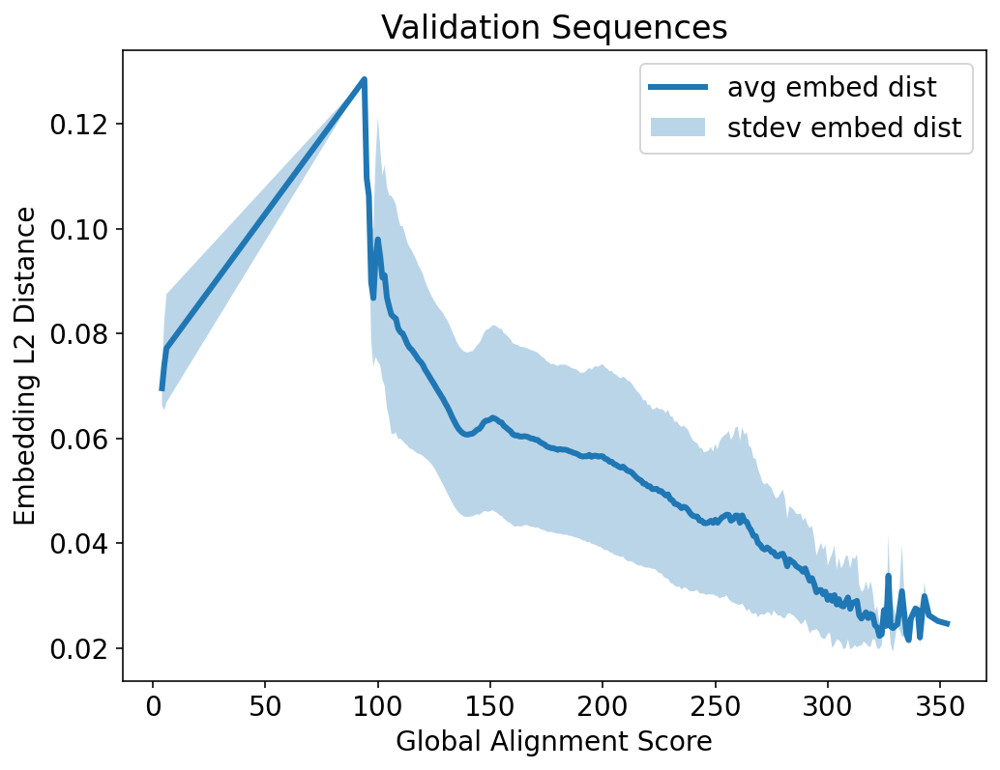

In [35]:
# plot the embedding L2 distance against the pairwise global alignment scores
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=val_avg_scores_df,
    save_path=save_path,
    alignment_type=alignment_type,
    plot_title=align_plot_title
)

# 5. Compute pairwise alignment between two types of sequences and select a specified number of sequences with the highest mean or max alignment score values.

Dataset: MDH GPT2 likely-wood-857

In [36]:
save_path = Path("/homes/lind/MDH-pipeline/visualize/gen_test_align.png")

num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

In [37]:
# generated sequences
gen_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-1024concat_seqs_fasta_embeddings_mean.npy")
gen_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857_1024concat_seqs.fasta")
alignment_type = "global"

embed_avg = np.load(gen_embed_path)
dna_seqs = metrics.get_seqs_from_fasta(fasta_path=gen_fasta_path)
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)
gen_protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)

In [38]:
# test sequences
test_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-test_fasta_embeddings_mean.npy")
test_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/test.fasta")
alignment_type = "global"

embed_avg = np.load(test_embed_path)
dna_seqs = metrics.get_seqs_from_fasta(fasta_path=test_fasta_path)
embed = np.load(test_embed_path)
dna_seqs = dna_seqs[: len(embed)]  # clip DNA sequence to embedding length
test_protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


In [39]:
gen_test_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=gen_protein_seqs,
    seqs2_rec=test_protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

1024it [01:34, 10.89it/s]


{'mean': array([149.25793217, 152.50464989, 160.34436543, ..., 162.40536105,
        156.93271335, 140.82439825]),
 'max': array([285., 271., 268., ..., 302., 284., 288.]),
 'min': array([ 90.,  90.,  93., ..., 100.,  92., 101.])}

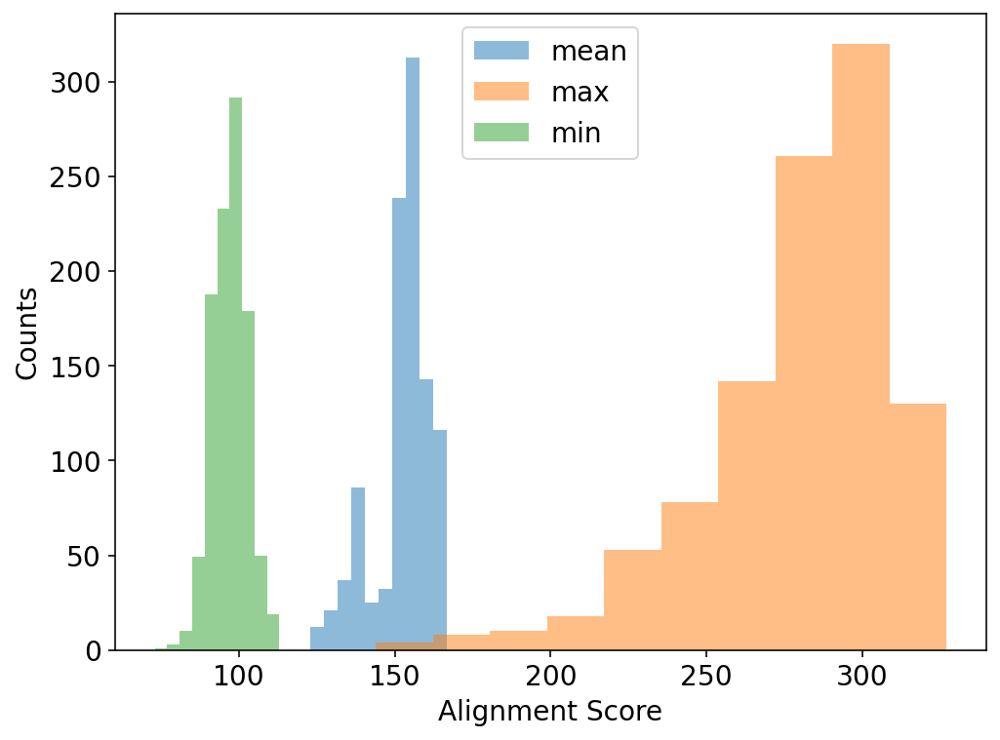

In [40]:
visualize.plot_align_hist_mean_max_min(gen_test_align_scores_matrix)